## Model for outcome 6 months after the (first) stroke

In [23]:
# general
import pandas as pd
import numpy as np
from functions import modeling_14d

# plot libarys
import seaborn as sns
import matplotlib.pyplot as plt

# Model preparation
#import imblearn
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV, cross_validate
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler, StandardScaler, LabelEncoder, OrdinalEncoder
from sklearn.compose import ColumnTransformer, make_column_selector
 

# Classifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier, export_graphviz  
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from xgboost import XGBClassifier

## Cluster and Dimension Reduction
from kneed import KneeLocator
from sklearn.cluster import DBSCAN, MiniBatchKMeans, KMeans, AgglomerativeClustering
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

# Model Metrics
from sklearn.metrics import precision_score, recall_score, roc_auc_score, roc_curve, confusion_matrix, classification_report, plot_confusion_matrix
from sklearn.metrics import f1_score, make_scorer, adjusted_rand_score # for modelling.py

# for merging the dataframes
import os, glob
import json

# further libarys
#import itertools
from sklearn.tree import export_graphviz
from collections import Counter

%matplotlib inline

In [3]:
#df = pd.read_csv('data/IST_corrected_model.csv',  index_col= [0])

In [229]:
df = pd.read_csv('data/IST_corrected_clean.csv',  index_col= [0])

In [230]:
# Only keep patients with an ischaemic stroke => df['DDIAGISC'].eq('Y')
df = df[df['DDIAGISC'].eq('Y')]

In [231]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16217 entries, 0 to 19434
Columns: 115 entries, HOSPNUM to DEAD
dtypes: float64(16), int64(29), object(70)
memory usage: 14.4+ MB


In [232]:
df.index = pd.RangeIndex(len(df.index))

In [233]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16217 entries, 0 to 16216
Columns: 115 entries, HOSPNUM to DEAD
dtypes: float64(16), int64(29), object(70)
memory usage: 14.2+ MB


### Target for 6 months after first stroke

Target for the second model is the outcome 6 months after the (first) stroke. (OCCODE)


In [234]:
df.OCCODE.value_counts()

Dependent        6485
Dead             3542
Not recovered    3371
Recovered        2819
Name: OCCODE, dtype: int64

In [235]:
print(f'Patients recovered: {round((df.OCCODE.value_counts()[3] / df.shape[0] * 100),1)} %')
print(f'Patients not recovered: {round((df.OCCODE.value_counts()[2] / df.shape[0] * 100),1)} %')
print(f'Patients dependent: {round((df.OCCODE.value_counts()[0] / df.shape[0] * 100),1)} %')
print(f'Patients deceased: {round((df.OCCODE.value_counts()[1] / df.shape[0] * 100),1)} %')

Patients recovered: 17.4 %
Patients not recovered: 20.8 %
Patients dependent: 40.0 %
Patients deceased: 21.8 %


In [257]:
df.DPE.value_counts()

N    16113
Y      104
Name: DPE, dtype: int64

In [502]:
df.NCB14.value_counts()

0    15755
1      462
Name: NCB14, dtype: int64

In [503]:
# Select features
features = ['SEX', 'AGE', 'RSBP', 'RDEF1', 'RDEF2', 'RDEF3', 'RDEF4', 'RDEF5', 'RDEF6', 'RDEF7', 'NCB14', 'STRK14']
X = df[features]
# 'RDEF8'
# ONDRUG, RDELAY, DMH14, DLH14, DASP, STYPE
#DPLACE, DHAEMD, add. drugs
# Select target
y = df.OCCODE

In [504]:
true_label_names = y.tolist()

In [505]:
label_encoder = LabelEncoder()
y_true = label_encoder.fit_transform(true_label_names)
#print(true_label_names)
print(label_encoder.classes_)


['Dead' 'Dependent' 'Not recovered' 'Recovered']


In [506]:
y_true = pd.Series(y_true) 

In [507]:
N_CLUSTERS = len(label_encoder.classes_)

In [508]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16217 entries, 0 to 16216
Data columns (total 12 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   SEX     16217 non-null  object
 1   AGE     16217 non-null  int64 
 2   RSBP    16217 non-null  int64 
 3   RDEF1   16217 non-null  object
 4   RDEF2   16217 non-null  object
 5   RDEF3   16217 non-null  object
 6   RDEF4   16217 non-null  object
 7   RDEF5   16217 non-null  object
 8   RDEF6   16217 non-null  object
 9   RDEF7   16217 non-null  object
 10  NCB14   16217 non-null  int64 
 11  STRK14  16217 non-null  int64 
dtypes: int64(4), object(8)
memory usage: 1.5+ MB


In [509]:
print(sorted(Counter(y).items()))

[('Dead', 3542), ('Dependent', 6485), ('Not recovered', 3371), ('Recovered', 2819)]


In [510]:
# Split the data in test and training set
X_train, X_test, y_train, y_test = train_test_split(X, y_true, test_size=0.3, random_state=42)

In [511]:
#convert all 'objects' into 'categories'
X_train = pd.concat([
        X_train.select_dtypes([], ['object']),
        X_train.select_dtypes(['object']).apply(pd.Series.astype, dtype='category')
        ], axis=1).reindex(X_train.columns, axis=1)
X_train.index = pd.RangeIndex(len(X_train.index))

In [512]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11351 entries, 0 to 11350
Data columns (total 12 columns):
 #   Column  Non-Null Count  Dtype   
---  ------  --------------  -----   
 0   SEX     11351 non-null  category
 1   AGE     11351 non-null  int64   
 2   RSBP    11351 non-null  int64   
 3   RDEF1   11351 non-null  category
 4   RDEF2   11351 non-null  category
 5   RDEF3   11351 non-null  category
 6   RDEF4   11351 non-null  category
 7   RDEF5   11351 non-null  category
 8   RDEF6   11351 non-null  category
 9   RDEF7   11351 non-null  category
 10  NCB14   11351 non-null  int64   
 11  STRK14  11351 non-null  int64   
dtypes: category(8), int64(4)
memory usage: 444.5 KB


In [513]:
#convert all 'objects' into 'categories'
X_test = pd.concat([
        X_test.select_dtypes([], ['object']),
        X_test.select_dtypes(['object']).apply(pd.Series.astype, dtype='category')
        ], axis=1).reindex(X_test.columns, axis=1)
X_test.index = pd.RangeIndex(len(X_test.index))

In [514]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4866 entries, 0 to 4865
Data columns (total 12 columns):
 #   Column  Non-Null Count  Dtype   
---  ------  --------------  -----   
 0   SEX     4866 non-null   category
 1   AGE     4866 non-null   int64   
 2   RSBP    4866 non-null   int64   
 3   RDEF1   4866 non-null   category
 4   RDEF2   4866 non-null   category
 5   RDEF3   4866 non-null   category
 6   RDEF4   4866 non-null   category
 7   RDEF5   4866 non-null   category
 8   RDEF6   4866 non-null   category
 9   RDEF7   4866 non-null   category
 10  NCB14   4866 non-null   int64   
 11  STRK14  4866 non-null   int64   
dtypes: category(8), int64(4)
memory usage: 191.2 KB


In [515]:
y_train.index = pd.RangeIndex(len(y_train.index))
y_test.index = pd.RangeIndex(len(y_test.index))

### Preparation of Data Scaling and Category Encoding
Some models need scaling of numerical features and encoding of categorical features. The sklearn preprocessors are instantiated here and used where necessary in the data transformation step of each model.

In [516]:
# encoder for categories
onehot = OneHotEncoder(drop="first")

# scalers for numerical features
mms = MinMaxScaler()
ss = StandardScaler()

# Prepare list of numerical and categorical columns
num_cols = make_column_selector(dtype_include=np.number)
cat_cols = make_column_selector(dtype_include='category')

In [517]:
# Define transformer
transformer = ColumnTransformer([
    ("encode", onehot, cat_cols),
    ("scale", mms, num_cols)
])

# Transform
X_train_trans = transformer.fit_transform(X_train)
X_test_trans = transformer.transform(X_test)

In [539]:
pca_ = PCA(n_components=2, random_state=42)
X_train_pca = pca_.fit_transform(X_train_trans)

In [540]:
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=150, n_init=10, random_state=42)
    kmeans.fit(X_train_pca)
    wcss.append(kmeans.inertia_)

In [541]:
kl = KneeLocator(
    range(1, 11), wcss, curve="convex", direction="decreasing"
    )
kl.elbow

3

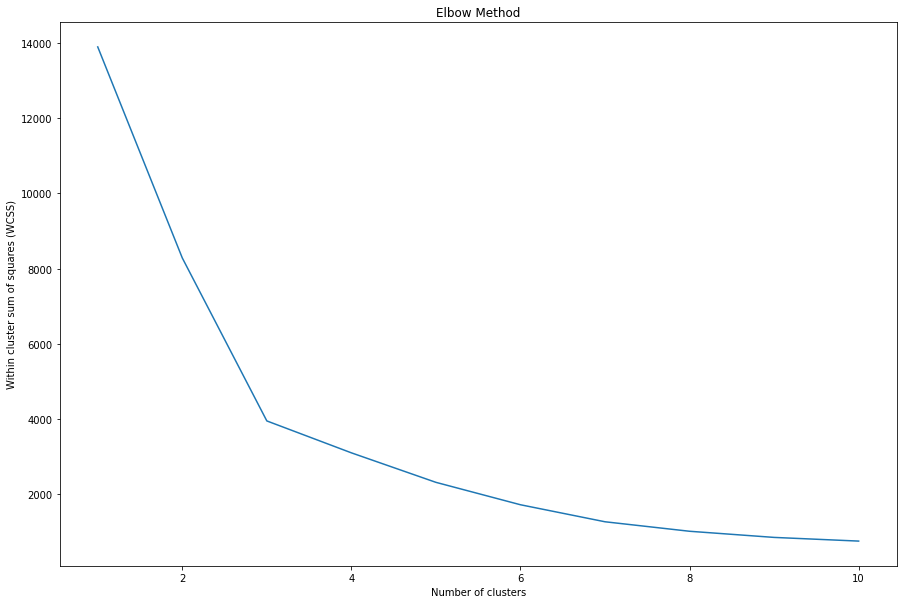

In [542]:
plt.plot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('Within cluster sum of squares (WCSS)')
plt.show()

In [543]:
# Creating the KMeans Clustering model and fit it to our data X_pca after Dimensionality Reduction
kmeans = KMeans(n_clusters= N_CLUSTERS, verbose=0, init='k-means++', max_iter=150, n_init=50, random_state=0)
kmeans.fit(X_train_pca)


KMeans(max_iter=150, n_clusters=4, n_init=50, random_state=0)

In [544]:
ari_kmeans = adjusted_rand_score(y_train, kmeans.labels_)
ari_kmeans

0.056532348209192416

In [545]:
# Create new dataframe with real and predicted labels 
df_res_kmeans = pd.DataFrame()
df_res_kmeans['PC1'] = X_train_pca[:, 0]
df_res_kmeans['PC2'] = X_train_pca[:, 1]
df_res_kmeans['org_target'] = y_train
df_res_kmeans['true_label'] = label_encoder.inverse_transform(y_train)
df_res_kmeans['pred_cluster'] = kmeans.labels_
df_res_kmeans.head()

,PC1,PC2,org_target,true_label,pred_cluster
0,0.146655,-0.959071,2,Not recovered,1
1,0.057972,-0.939650,1,Dependent,1
2,-0.441418,-0.649126,1,Dependent,1
3,0.736774,-0.659203,1,Dependent,1
4,0.138751,-0.954993,0,Dead,1


/Users/Nicole/Documents/Data_Science/neuefische/projects/Capstone/stroke/Capstone/.venv/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


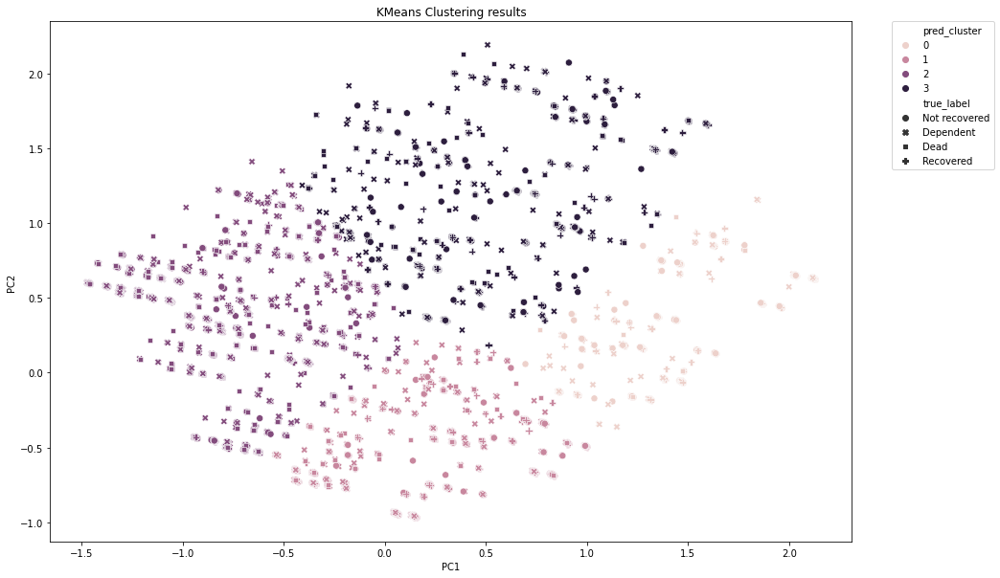

In [546]:
scat = sns.scatterplot(
    x = 'PC1',
    y = 'PC2',
    s=50,
    data=df_res_kmeans ,
    hue="pred_cluster",
    style="true_label",
)

scat.set_title(
    "KMeans Clustering results"
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.show()

In [547]:
print(df_result.org_target.unique())
print(df_result.pred_target.unique())

[2 3 1 0]
[3 1 2 0]


In [548]:
# Since we know the correct lables we can also evaluate the performance of the algorithm
print(confusion_matrix(y_train,kmeans.labels_))
print(classification_report(y_train,kmeans.labels_))

[[  65  555 1620  229]
 [ 272 1716 2046  521]
 [ 312 1115  524  396]
 [ 355  897  337  391]]
              precision    recall  f1-score   support

           0       0.06      0.03      0.04      2469
           1       0.40      0.38      0.39      4555
           2       0.12      0.22      0.15      2347
           3       0.25      0.20      0.22      1980

    accuracy                           0.24     11351
   macro avg       0.21      0.21      0.20     11351
weighted avg       0.24      0.24      0.23     11351



### MiniBatch KMeans

In [564]:
pca_ = PCA(n_components=4, random_state=42)
X_train_pca = pca_.fit_transform(X_train_trans)

In [565]:
# Creating the MiniBatchKMeans Clustering model and fit it to our preprocessed data
batch_kmeans = MiniBatchKMeans(n_clusters=N_CLUSTERS, verbose=0, max_iter=150, n_init=20, random_state=0)
batch_kmeans.fit(X_train_pca)

MiniBatchKMeans(max_iter=150, n_clusters=4, n_init=20, random_state=0)

In [566]:
ari_batch_kmeans = adjusted_rand_score(y_train, batch_kmeans.labels_)
ari_batch_kmeans

0.052994039461532534

In [567]:
# Create new dataframe with real and predicted labels 
df_res_batch_kmeans = pd.DataFrame()
df_res_batch_kmeans['PC1'] = X_train_pca[:, 0]
df_res_batch_kmeans['PC2'] = X_train_pca[:, 1]
df_res_batch_kmeans['org_target'] = y_train
df_res_batch_kmeans['true_label'] = label_encoder.inverse_transform(y_train)
df_res_batch_kmeans['pred_cluster'] = batch_kmeans.labels_
df_res_batch_kmeans.head()

,PC1,PC2,org_target,true_label,pred_cluster
0,0.146655,-0.959071,2,Not recovered,1
1,0.057973,-0.939650,1,Dependent,1
2,-0.441418,-0.649126,1,Dependent,1
3,0.736774,-0.659203,1,Dependent,1
4,0.138751,-0.954994,0,Dead,1


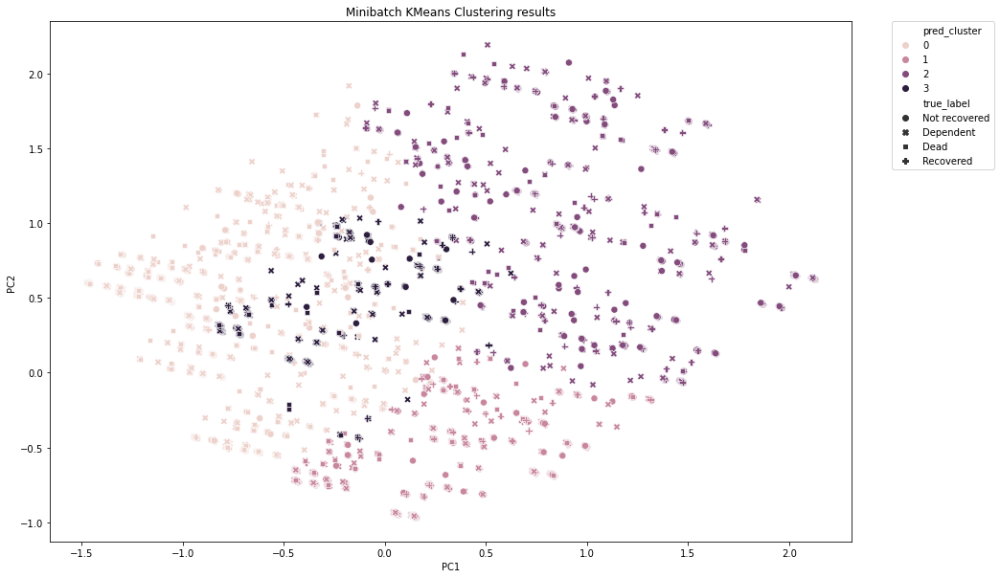

In [569]:
scat = sns.scatterplot(
    x = 'PC1',
    y = 'PC2',
    s=50,
    data=df_res_batch_kmeans ,
    hue="pred_cluster",
    style="true_label",
)

scat.set_title(
    "Minibatch KMeans Clustering results"
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.show()

In [570]:
# Since we know the correct lables we can also evaluate the performance of the algorithm
print(confusion_matrix(y_train,batch_kmeans.labels_))
print(classification_report(y_train,batch_kmeans.labels_))

[[1402  526  196  345]
 [1491 1692  515  857]
 [ 256 1130  527  434]
 [ 161  926  584  309]]
              precision    recall  f1-score   support

           0       0.42      0.57      0.49      2469
           1       0.40      0.37      0.38      4555
           2       0.29      0.22      0.25      2347
           3       0.16      0.16      0.16      1980

    accuracy                           0.35     11351
   macro avg       0.32      0.33      0.32     11351
weighted avg       0.34      0.35      0.34     11351



### Agglomerative Clustering

In [591]:
pca_ = PCA(n_components=3, random_state=42)
X_train_pca = pca_.fit_transform(X_train_trans)

In [592]:
# Creating the AgglomerativeClustering model and fit it to our preprocessed data
agg_clust = AgglomerativeClustering(n_clusters=N_CLUSTERS, linkage='ward').fit(X_train_pca)

In [593]:
ari_agg_clust = adjusted_rand_score(y_train, agg_clust.labels_)
ari_agg_clust

0.043185104023047226

In [594]:
# Create new dataframe with real and predicted labels 
df_res_agg_clust = pd.DataFrame()
df_res_agg_clust ['PC1'] = X_train_pca[:, 0]
df_res_agg_clust ['PC2'] = X_train_pca[:, 1]
df_res_agg_clust ['org_target'] = y_train
df_res_agg_clust ['true_label'] = label_encoder.inverse_transform(y_train)
df_res_agg_clust ['pred_cluster'] = batch_kmeans.labels_
df_res_agg_clust .head()

,PC1,PC2,org_target,true_label,pred_cluster
0,0.146655,-0.959071,2,Not recovered,1
1,0.057973,-0.939650,1,Dependent,1
2,-0.441418,-0.649126,1,Dependent,1
3,0.736774,-0.659203,1,Dependent,1
4,0.138751,-0.954994,0,Dead,1


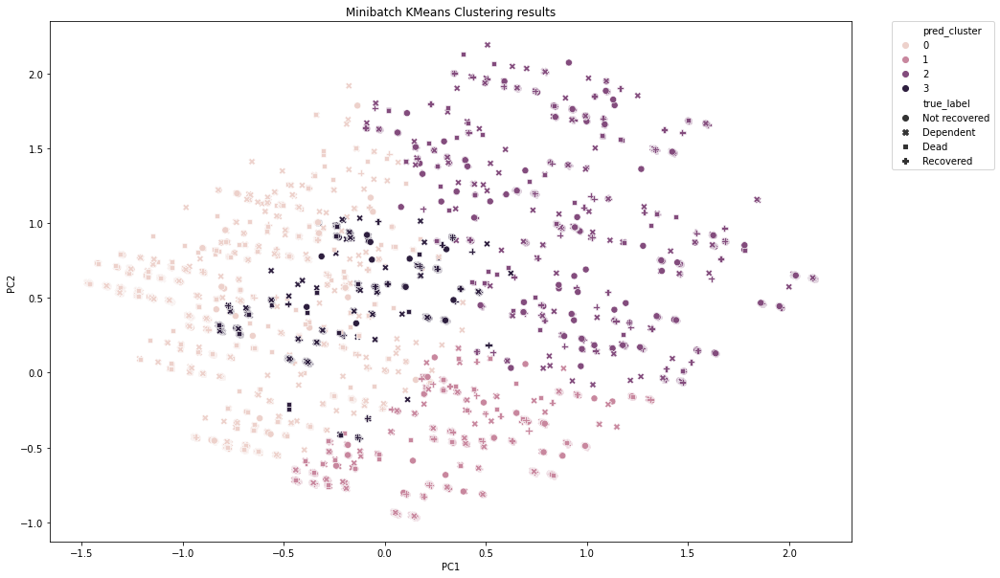

In [595]:
scat = sns.scatterplot(
    x = 'PC1',
    y = 'PC2',
    s=50,
    data=df_res_agg_clust ,
    hue="pred_cluster",
    style="true_label",
)

scat.set_title(
    "Minibatch KMeans Clustering results"
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.show()

### DBSCAN


In [597]:
pca_ = PCA(n_components=2, random_state=42)
X_train_pca = pca_.fit_transform(X_train_trans)

In [623]:
db_clust = DBSCAN(eps = 0.005, min_samples = 100).fit(X_train_pca)

In [624]:
ari_db_clust = adjusted_rand_score(y_train, db_clust.labels_)
ari_db_clust

0.013539072926845759

In [625]:
pd.DataFrame(db_clust.labels_)[0].unique()

array([ 0,  1, -1,  2,  3,  4, 13,  5,  6,  7,  8,  9, 11, 10, 15, 12, 14])